## get query level data

goal is to have a dataframe at the query level (to save space maybe book metadata will be in a separate file that can be mapped to the query level data). columns should have: 

- query_id
- query 
- book_title
- mapfilename
- correct_answer
- gpt35_turbo_answer
- gpt4o_answer
- claude_answer
- llama8b_answer
- llama70b_answer
- (and all book metadata)


In [3]:
import ast
import string
import os
import pandas as pd
import json
import csv
import re

os.chdir("/Users/stellajia/Dropbox/23.Copyright-LLMs")

# gpt3.5
gpt35_query_lvl_json = 'rawdata/model-output/gpt35-output.jsonl'
gpt35_query_lvl_csv = 'rawdata/model-output-clean/gpt35_query_lvl.csv'

# gpt4o
gpt4o_query_lvl_json = 'rawdata/model-output/gpt4o-output.jsonl'
gpt4o_query_lvl_csv = 'rawdata/model-output-clean/gpt4o_query_lvl.csv'
# claude
claude_folder = 'rawdata/model-output/claude-output'
claude_query_lvl_csv = 'rawdata/model-output-clean/claude_query_lvl.csv'

# llama 8b
## each book is stored as a CSV file
llama8b_folder = 'rawdata/model-output/llama-3.1-8B-output'
llama8b_query_lvl_csv = 'rawdata/model-output-clean/llama8b_query_lvl.csv'

# llama 70b
## each book is stored as a CSV file
llama70b_folder = 'rawdata/model-output/llama-3.1-70B-output'
llama70b_query_lvl_csv = 'rawdata/model-output-clean/llama70b_query_lvl.csv'

# gemini
## each book is stored as a folder with a jsonl file inside (repetitive)
gemini_folder = 'rawdata/model-output/gemini-output'
gemini_query_lvl_csv = 'rawdata/model-output-clean/gemini_query_lvl.csv'


## Process GPT
All books stored in a single JSONL file.

In [31]:
import json
import csv
import os

def process_json_to_csv(json_file_path, csv_file_path, file_type="json"):
    """
    Converts a JSON or JSONL file to a CSV file.
    
    :param json_file_path: Path to the input JSON or JSONL file.
    :param csv_file_path: Path to the output CSV file.
    :param file_type: Either "json" for a standard JSON file or "jsonl" for a JSONL file.
    """
    # Ensure the file exists
    if not os.path.exists(json_file_path):
        print(f"Error: The file {json_file_path} does not exist.")
        return
    
    # Check if the file is empty
    if os.stat(json_file_path).st_size == 0:
        print(f"Error: The file {json_file_path} is empty.")
        return

    # Open the CSV file for writing
    with open(csv_file_path, mode='w', newline='', encoding='utf-8') as csv_file:
        # Define CSV columns
        fieldnames = ['book_title', 'query_id', 'query', 'gpt_answer', 'correct_answer']
        writer = csv.DictWriter(csv_file, fieldnames=fieldnames)
        writer.writeheader()  # Write header row

        n = 0  # Move n outside so it tracks across JSONL lines

        try:
            with open(json_file_path, 'r', encoding='utf-8') as json_file:
                if file_type == "json":  
                    # ✅ JSON File: Load entire file
                    data = json.load(json_file)  
                    n += process_data_to_csv(data, writer, n)

                elif file_type == "jsonl":  
                    # ✅ JSONL File: Read line by line
                    for line in json_file:
                        line = line.strip()
                        if line:  # Ignore empty lines
                            try:
                                data = json.loads(line)  # Load one JSON object per line
                                n += process_data_to_csv(data, writer, n)
                            except json.JSONDecodeError as e:
                                print(f"Skipping malformed JSONL line: {e}")
                else:
                    print(f"Error: Invalid file_type '{file_type}'. Use 'json' or 'jsonl'.")
                    return

            print(f"✅ Data successfully written to {csv_file_path}")

        except json.JSONDecodeError as e:
            print(f"Error decoding JSON: {e}")

def process_data_to_csv(data, writer, n):
    """Processes JSON data and writes it to the CSV file."""
    count = 0  # Track books in this batch
    for book_title, passages in data.items():
        for passage_id, passage_data in passages.items():
            try:
                gpt_answer = passage_data['output']['response']
                correct_answer = passage_data['output']['correct']
                query = passage_data['input']['passage']

                writer.writerow({
                    'book_title': book_title,
                    'query_id': passage_id,
                    'query': query,
                    'gpt_answer': gpt_answer,
                    'correct_answer': correct_answer
                })
            except KeyError as e:
                print(f"⚠️ Missing key {e} in book {book_title}, passage {passage_id}")

        count += 1
        print(f"📚 {n + count}: {book_title} processed")  # Now increments properly
    
    return count  # Return how many books were processed


In [37]:
process_json_to_csv(gpt35_query_lvl_json, gpt35_query_lvl_csv, "jsonl")

📚 1: insight-into-ielts-student's-book-updated-edition:-the-cambridge-ielts-course,jakeman,-vanessa,-mcdowell,-clare processed
📚 2: synthese-der-zellbausteine-in-pflanze-und-tier:-lösung-des-problems-der-künstlichen-darstellung-der-nahrungsstoffe-(german-edition),abderhalden,-emil processed
📚 3: the-shi'is-of-iraq,nakash,-yitzhak processed
📚 4: a-world-beneath-the-sands:-the-golden-age-of-egyptology,wilkinson,-toby processed
📚 5: angel-falls,kristin-hannah processed
📚 6: the-spy-who-came-in-from-the-cold,le-carre,-john processed
📚 7: light-on-the-landscape:-photographs-and-lessons-from-a-life-in-photography,neill,-william processed
📚 8: american-foreign-relations:-a-history,-volume-2:-since-1895,paterson,-thomas,-clifford,-j.-garry,-maddock,-shane-j.,-kisatsky,-deborah,-hagan,-kenneth processed
📚 9: inherently-safer-chemical-processes:-a-life-cycle-approach,ccps-(center-for-chemical-process-safety) processed
📚 10: translation:-an-advanced-resource-book-(routledge-applied-linguistics),h

In [49]:
gpt35_query_lvl_df = pd.read_csv(gpt35_query_lvl_csv)
# rename gpt_answer to gpt35_answer
print(gpt35_query_lvl_df.shape)
print(gpt35_query_lvl_df.columns)
gpt35_query_lvl_df.head(3)

(1371795, 5)
Index(['book_title', 'query_id', 'query', 'gpt35_answer', 'correct_answer'], dtype='object')


,book_title,query_id,query,gpt35_answer,correct_answer
0,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"WOMAN Oh, it's ... uh ... lovely, darling. Gir...",<name>Girl</name>,NARRATOR
1,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"Let's get going shall we, because we've got a ...",<name>Jack</name>,Ben
2,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"Unless you work to keep fit, you run the risk ...",<name>medical</name>,Sample


In [50]:
# remove duplicates (fetching batch script will overestimate amount of books to collect--keep first duplicate)
gpt35_query_lvl_df = gpt35_query_lvl_df.drop_duplicates(subset='query_id', keep='first')
print(gpt35_query_lvl_df.shape)


(1371211, 5)


In [33]:
# process gpt4o
process_json_to_csv(gpt4o_query_lvl_json, gpt4o_query_lvl_csv)

📚 1: light-on-the-landscape:-photographs-and-lessons-from-a-life-in-photography,neill,-william processed
📚 2: american-foreign-relations:-a-history,-volume-2:-since-1895,paterson,-thomas,-clifford,-j.-garry,-maddock,-shane-j.,-kisatsky,-deborah,-hagan,-kenneth processed
📚 3: angel-falls,kristin-hannah processed
📚 4: synthese-der-zellbausteine-in-pflanze-und-tier:-lösung-des-problems-der-künstlichen-darstellung-der-nahrungsstoffe-(german-edition),abderhalden,-emil processed
📚 5: inherently-safer-chemical-processes:-a-life-cycle-approach,ccps-(center-for-chemical-process-safety) processed
📚 6: insight-into-ielts-student's-book-updated-edition:-the-cambridge-ielts-course,jakeman,-vanessa,-mcdowell,-clare processed
📚 7: a-world-beneath-the-sands:-the-golden-age-of-egyptology,wilkinson,-toby processed
📚 8: translation:-an-advanced-resource-book-(routledge-applied-linguistics),hatim,-basil,-munday,-jeremy processed
📚 9: the-spy-who-came-in-from-the-cold,le-carre,-john processed
📚 10: the-shi

In [34]:
gpt4o_query_lvl_df = pd.read_csv(gpt4o_query_lvl_csv)
print(gpt4o_query_lvl_df.shape)
print(gpt4o_query_lvl_df.columns)

(1371219, 5)
Index(['book_title', 'query_id', 'query', 'gpt_answer', 'correct_answer'], dtype='object')


In [58]:
# Merge and clean GPT data

# rename gpt_answer to gpt35_answer and gpt4o_answer
gpt35_query_lvl_df = gpt35_query_lvl_df.rename(columns={'gpt_answer': 'gpt35_answer'})
gpt4o_query_lvl_df = gpt4o_query_lvl_df.rename(columns={'gpt_answer': 'gpt4o_answer'})

# save to csv
gpt35_query_lvl_df.to_csv(gpt35_query_lvl_csv, index=False)
gpt4o_query_lvl_df.to_csv(gpt4o_query_lvl_csv, index=False)


## Process Llama

In [16]:
def merge_csv_files(input_folder: str, output_file: str):
    """
    Merges all non-empty CSV files in the given input folder into a single CSV file.
    
    Parameters:
        input_folder (str): Path to the folder containing CSV files.
        output_file (str): Path to save the merged CSV file.
    
    Each row in the merged CSV retains the source file name under "map_file_name".
    Skipped empty files are printed at the end.
    """
    all_dfs = []
    skipped_files = []
    n = 0

    for file in os.listdir(input_folder):
        if file.endswith(".csv"):
            file_path = os.path.join(input_folder, file)
            
            if os.path.getsize(file_path) == 0:
                skipped_files.append(file)  # Store skipped files
                print(f"Skipping empty file: {file}")
                continue  # Skip empty files
            
            df = pd.read_csv(file_path)

            n += 1
            df["map_file_name"] = file  # Add column to store file name
            all_dfs.append(df)
            print(f"{n}: {file} processed")

    # Concatenate all dataframes
    if all_dfs:
        merged_df = pd.concat(all_dfs, ignore_index=True)
        merged_df.to_csv(output_file, index=False)
        print(f"Merged CSV saved as {output_file}")
    else:
        print("No non-empty CSV files found in the folder.")

    # Print skipped files
    if skipped_files:
        print(f"Skipped {len(skipped_files)} empty files: {skipped_files}")

In [17]:
# Llama 8b
merge_csv_files(llama8b_folder, llama8b_query_lvl_csv)

1: general-staffs-and-diplomacy-before-the-second-world-war,preston,-adrian,-ed.csv processed
2: big-fat-lies:-the-truth-about-your-weight-and-your-health,glenn-a.-gaesser.csv processed
3: calculus-of-a-single-variable-(ap-edition),larson,-ron,-edwards,-bruce-h..csv processed
4: the-capacity-of-international-organizations-to-conclude-treaties,-and-the-special-legal-aspects-of-the-treaties-so-concluded,chiu,-hungdah.csv processed
5: health-visiting:-a-rediscovery,gretl-a.-mchugh,-jean-orr,-karen-luker.csv processed
6: ordeal-by-fire:-the-civil-war-and-reconstruction,james-m.-mcpherson.csv processed
7: applied-computational-economics-and-finance-(the-mit-press),miranda,-mario-j.,-fackler,-paul-l..csv processed
8: abraham-lincoln:-great-american-historians-on-our-sixteenth-president,susan---swain,-brian--lamb.csv processed
9: you-can-be-an-optimist:-change-your-thinking,-change-your-life,lucy-macdonald.csv processed
10: kingdom-of-the-wicked-(kingdom-of-the-wicked,-1),maniscalco,-kerri.cs

In [18]:
# Llama 70b
merge_csv_files(llama70b_folder, llama70b_query_lvl_csv)

1: general-staffs-and-diplomacy-before-the-second-world-war,preston,-adrian,-ed.csv processed
2: big-fat-lies:-the-truth-about-your-weight-and-your-health,glenn-a.-gaesser.csv processed
3: calculus-of-a-single-variable-(ap-edition),larson,-ron,-edwards,-bruce-h..csv processed
4: the-capacity-of-international-organizations-to-conclude-treaties,-and-the-special-legal-aspects-of-the-treaties-so-concluded,chiu,-hungdah.csv processed
5: health-visiting:-a-rediscovery,gretl-a.-mchugh,-jean-orr,-karen-luker.csv processed
6: ordeal-by-fire:-the-civil-war-and-reconstruction,james-m.-mcpherson.csv processed
7: applied-computational-economics-and-finance-(the-mit-press),miranda,-mario-j.,-fackler,-paul-l..csv processed
8: abraham-lincoln:-great-american-historians-on-our-sixteenth-president,susan---swain,-brian--lamb.csv processed
9: you-can-be-an-optimist:-change-your-thinking,-change-your-life,lucy-macdonald.csv processed
10: kingdom-of-the-wicked-(kingdom-of-the-wicked,-1),maniscalco,-kerri.cs

In [19]:
# Merge and clean Llama CSV files

llama_8b_df = pd.read_csv(llama8b_query_lvl_csv)
llama_70b_df = pd.read_csv(llama70b_query_lvl_csv)

## remove .csv from map_file_name
llama_8b_df['map_file_name'] = llama_8b_df['map_file_name'].str.replace('.csv', '') 
llama_70b_df['map_file_name'] = llama_70b_df['map_file_name'].str.replace('.csv', '')

## rename final_output to llama8b_anwer and llama70b_answer
llama_8b_df = llama_8b_df.rename(columns={'final_output': 'llama8b_answer'})
llama_70b_df = llama_70b_df.rename(columns={'final_output': 'llama70b_answer'})

## rename custom_id to query_id
llama_8b_df = llama_8b_df.rename(columns={'custom_id': 'query_id'})
llama_70b_df = llama_70b_df.rename(columns={'custom_id': 'query_id'})

## save to csv
llama_8b_df.to_csv(llama8b_query_lvl_csv, index=False)
llama_70b_df.to_csv(llama70b_query_lvl_csv, index=False)


## Process Claude

In [20]:
merge_csv_files(claude_folder, claude_query_lvl_csv)

1: diary-of-a-bomb-aimer:-flying-with-12-squadron-in-world-war-ii,philip-swan,-campbell-muirhead_mapping.csv processed
2: to-change-the-world:-the-irony,-tragedy,-and-possibility-of-christianity-in-the-late-modern-world,davison-hunter,-james_mapping.csv processed
3: ways-of-the-world:-a-global-history-with-sources,-volume-1:-to-1500,strayer,-robert-w._mapping.csv processed
4: the-nature-of-economies,jane-jacobs_mapping.csv processed
5: advanced-organic-chemistry:-part-a:-structure-and-mechanisms,carey,-francis-a.,-sundberg,-richard-j._mapping.csv processed
6: sanctions-and-dominion:-an-economic-commentary-on-numbers,gary-north_mapping.csv processed
7: the-hobbit:-the-desolation-of-smaug---official-movie-guide,brian-sibley_mapping.csv processed
8: designing-surveys:-a-guide-to-decisions-and-procedures,blair,-johnny,-czaja,-ronald-f.,-blair,-edward_mapping.csv processed
9: 10,000-drinks:-how-to-turn-your-basement-into-the-most-happening-bar-in-town!,paul-knorr_mapping.csv processed
10: p

In [21]:
claude_df = pd.read_csv(claude_query_lvl_csv)
print(claude_df.shape)
print(claude_df.columns)

(1371319, 4)
Index(['original_custom_id', 'anthropic_id', 'text', 'map_file_name'], dtype='object')


In [22]:
# Merge and clean Claude CSV files

# take out .csv
claude_df['map_file_name'] = claude_df['map_file_name'].str.replace('.csv', '') 

# rename original_custom_id to query_id
claude_df = claude_df.rename(columns={'original_custom_id': 'query_id'})

# rename text to claude_answer
claude_df = claude_df.rename(columns={'text': 'claude_answer'})

# save claude_df to csv
claude_df.to_csv(claude_query_lvl_csv, index=False)

## Process Gemini

In [75]:
import pandas as pd
gemini_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/gemini/scraped_results_with_custom_id_14k.csv')
print(gemini_df.shape)
# rename passage to query
gemini_df = gemini_df.rename(columns={'passage': 'query'})
# rename gemini_token to gemini_answer
gemini_df = gemini_df.rename(columns={'gemini_token': 'gemini_answer'})
gemini_df = gemini_df.rename(columns={'original_filename': 'book_title'})


# remove the "\n Output:" from query
gemini_df['query'] = gemini_df['query'].str.slice(0, -12)
print(gemini_df.columns)

# remove when gemini_answer is none
gemini_df = gemini_df[gemini_df['gemini_answer'].notna()]
print(gemini_df.shape)

# remove duplicate query 
gemini_df = gemini_df.drop_duplicates(subset='query', keep='first')
print(gemini_df.shape)


(1302418, 8)
Index(['subfolder_name', 'query', 'gemini_response', 'log_prob',
       'gemini_answer', 'custom_id', 'correct_token', 'book_title'],
      dtype='object')
(1298339, 8)
(1271131, 8)


In [77]:
gemini_df.to_csv('/home/stellajia/genai-copyright/experiment/gemini/gemini_query_lvl.csv', index=False)

## Merge All Model Data Together

In [138]:
gpt35_query_lvl_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/query-level-data/gpt35_query_lvl.csv')
gpt4o_query_lvl_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/query-level-data/gpt4o_query_lvl.csv')
llama_8b_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/query-level-data/llama_output_8b_query_lvl.csv')
llama_70b_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/query-level-data/llama_output_70b_query_lvl.csv')
claude_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/query-level-data/claude_query_lvl.csv')
gemini_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/gemini/gemini_query_lvl.csv')

In [60]:
print(gpt35_query_lvl_df.shape)
print(gpt4o_query_lvl_df.shape)
print(llama_8b_df.shape)
print(llama_70b_df.shape)
print(claude_df.shape)

(1371211, 5)
(1371219, 5)
(1353465, 3)
(1371321, 3)
(1371319, 4)


In [83]:
# number of unique books in each
print(gpt35_query_lvl_df['book_title'].nunique())
print(gpt4o_query_lvl_df['book_title'].nunique())
print(llama_8b_df['map_file_name'].nunique())
print(llama_70b_df['map_file_name'].nunique())
print(claude_df['map_file_name'].nunique())
print(gemini_df['book_title'].nunique())

14887
14887
14848
14888
14888
14027


In [139]:
# merge all by query_id
merged_df = pd.merge(gpt35_query_lvl_df, gpt4o_query_lvl_df, on='query', how='left')
print(f"GPT35 and GPT4O merge: {merged_df.shape}")
# only keep query_id_y, remove query_i# d_x
merged_df = merged_df.drop(columns=['query_id_x', 'correct_answer_x'])
merged_df = merged_df.rename(columns={'query_id_y': 'query_id'})
merged_df = merged_df.rename(columns={'correct_answer_y': 'correct_answer'})

merged_df = pd.merge(merged_df, llama_8b_df, on='query_id', how='left')
# merged_df = pd.merge(merged_df, llama_8b_df, on='query_id', how='left')
print(f"Llama 8B merge: {merged_df.shape}")

merged_df = pd.merge(merged_df, llama_70b_df, on='query_id', how='left')
print(f"Llama 70B merge: {merged_df.shape}")

merged_df = pd.merge(merged_df, claude_df, on='query_id', how='left')
print(f"Claude merge: {merged_df.shape}")

merged_df = pd.merge(merged_df, gemini_df, on='query', how='left')
print(f"Gemini merge: {merged_df.shape}")

# Clean merged_df
print("Original shape: ", merged_df.shape)

## keep book_title_y, query_id, map_file_name, gpt35_answer, gpt4o_answer, llama8b_answer, llama70b_answer, claude_answer, correct_answer_y
merged_df = merged_df[['book_title_y', 'query_id', 'query','map_file_name', 'gpt35_answer', 'gpt4o_answer', 'llama8b_answer', 'llama70b_answer', 'claude_answer', 'gemini_answer', 'correct_answer']]
## rename book_title_y to book_title
merged_df = merged_df.rename(columns={'book_title_y': 'book_title'})
## remove null correct_answer (correct answer was not saved in query_id)
merged_df = merged_df[merged_df['correct_answer'].notna()]
print(f"After removing null correct_answer: {merged_df.shape}")
## remove null gemini_answer
merged_df = merged_df[merged_df['gemini_answer'].notna()]
print(f"After removing null gemini_answer: {merged_df.shape}")
## remove null llama8b_answer
merged_df = merged_df[merged_df['llama8b_answer'].notna()]
print(f"After removing null llama8b_answer: {merged_df.shape}")

# check number of duplicates
print(f"Number of duplicates: {merged_df.duplicated().sum()}")

## remove duplicates
merged_df = merged_df.drop_duplicates(subset='query_id', keep='first')
print(f"After removing duplicates: {merged_df.shape}")

GPT35 and GPT4O merge: (2082117, 9)
Llama 8B merge: (2082125, 9)
Llama 70B merge: (2082197, 11)
Claude merge: (2082845, 14)
Gemini merge: (2082870, 21)
Original shape:  (2082870, 21)
After removing null correct_answer: (2076637, 11)
After removing null gemini_answer: (2000867, 11)
After removing null llama8b_answer: (1981013, 11)
Number of duplicates: 661299
After removing duplicates: (1273273, 11)


In [140]:
## take out <name>, <\nname>, </name> from answers write function 
def clean_answers(answer):
    if isinstance(answer, str):
        # Regular expression to match text inside <word></word> tags
        answer = re.sub(r'</?[^>]+>', '', answer)
        answer = answer.lower()
    return answer

merged_df['gpt35_answer'] = merged_df['gpt35_answer'].apply(clean_answers)
merged_df['gpt4o_answer'] = merged_df['gpt4o_answer'].apply(clean_answers)
merged_df['llama8b_answer'] = merged_df['llama8b_answer'].apply(clean_answers)
merged_df['llama70b_answer'] = merged_df['llama70b_answer'].apply(clean_answers)
merged_df['claude_answer'] = merged_df['claude_answer'].apply(clean_answers)
merged_df['gemini_answer'] = merged_df['gemini_answer'].apply(clean_answers)
merged_df['correct_answer'] = merged_df['correct_answer'].apply(clean_answers)

In [141]:
merged_df.head(2)

,book_title,query_id,query,map_file_name,gpt35_answer,gpt4o_answer,llama8b_answer,llama70b_answer,claude_answer,gemini_answer,correct_answer
0,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"WOMAN Oh, it's ... uh ... lovely, darling. Gir...",insight-into-ielts-student's-book-updated-edit...,girl,mum,mum,mum,mum,mum,narrator
1,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"Let's get going shall we, because we've got a ...",insight-into-ielts-student's-book-updated-edit...,jack,alex,pearse,john,peter,david,ben


In [142]:
# remove all punctuation from map_file_name
translator = str.maketrans('', '', string.punctuation + " ")
merged_df['map_file_name'] = merged_df['map_file_name'].apply(lambda x: x.translate(translator))
merged_df['map_file_name'] = merged_df['map_file_name'].str.replace('mapping', '')
merged_df.tail(2)

,book_title,query_id,query,map_file_name,gpt35_answer,gpt4o_answer,llama8b_answer,llama70b_answer,claude_answer,gemini_answer,correct_answer
2082868,the-proper-study-of-mankind:-an-anthology-of-e...,the-proper-study-of-mankind:-an-anthology-of-e...,[MASK] knows what the uneducated German of his...,theproperstudyofmankindananthologyofessaysisai...,socrates,socrates,nietzsche,goethe,nietzsche,socrates,fichte
2082869,the-proper-study-of-mankind:-an-anthology-of-e...,the-proper-study-of-mankind:-an-anthology-of-e...,"And this is ruled out as unthinkable, 'reason ...",theproperstudyofmankindananthologyofessaysisai...,moral,hume,darwin,calvin,marx,spengler,histori


In [106]:
# number of unique books
print(merged_df['book_title'].nunique())
print(merged_df.shape)

14186
(1273273, 11)


In [143]:
merged_df.to_csv('/home/stellajia/genai-copyright/experiment/query-level-data/merged_query_lvl.csv', index=False)

## Map to Book Level Metadata

In [144]:
import pandas as pd
query_lvl_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/query-level-data/merged_query_lvl.csv')
print(query_lvl_df.shape)
query_lvl_df.head(2)

book_lvl_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/all_books_in_books3_updated.csv')
print(book_lvl_df.shape)
book_lvl_df = book_lvl_df.rename(columns={'file_name': 'map_file_name'})

(1273273, 11)


/tmp/ipykernel_689085/3403764170.py:6: DtypeWarning: Columns (10,11,12,15,16,17,23,24) have mixed types. Specify dtype option on import or set low_memory=False.
  book_lvl_df = pd.read_csv('/home/stellajia/genai-copyright/experiment/all_books_in_books3_updated.csv')


(518684, 25)


In [112]:
book_lvl_df.columns

Index(['title', 'author', 'isbn13', 'num_ratings', 'num_reviews', 'avg_rating',
       'genres', 'link', 'goodreads_year', 'in_books3', 'Subjects', 'isbn10',
       'year', 'final_year', 'google_year', 'isbn10_v2', 'isbn13_v2',
       'num_pages', 'open_lib_year', 'title_author', 'downloaded', 'match',
       'file_name', 'in_libgen', 'in_public_domain'],
      dtype='object')

In [146]:
## check number of unique map_file_name
print(query_lvl_df['map_file_name'].nunique())
print(book_lvl_df['map_file_name'].nunique())

## see how many unique map_file_name are in book_lvl_df
print(book_lvl_df[book_lvl_df['map_file_name'].isin(query_lvl_df['map_file_name'])].shape)

# merge by map_file_name
merged_df = pd.merge(query_lvl_df, book_lvl_df, on='map_file_name', how='left')
print(merged_df.shape)


14164
518683
(13036, 25)
(1273273, 35)


In [147]:
# keep main columns
merged_df = merged_df[['book_title', 'query_id', 'query', 'map_file_name', 'gpt35_answer', 'gpt4o_answer', 'llama8b_answer', 'llama70b_answer', 'claude_answer', 'gemini_answer', 'correct_answer', 'in_books3', 'num_reviews', 'num_ratings', 
                       'avg_rating', 'genres', 'goodreads_year', 'author',
                       'isbn13', 'isbn10_v2', 'isbn13_v2']]

In [127]:
# check proportion of missing values in all columns
print(merged_df.isna().sum() / merged_df.shape[0])

book_title         0.000000
query_id           0.000000
query              0.000003
map_file_name      0.000000
gpt35_answer       0.000104
gpt4o_answer       0.000096
llama8b_answer     0.000118
llama70b_answer    0.000494
claude_answer      0.000059
gemini_answer      0.000031
correct_answer     0.000000
in_books3          0.000000
num_reviews        0.000000
num_ratings        0.000000
avg_rating         0.000000
genres             0.000000
goodreads_year     0.002116
author             0.000000
isbn13             0.000000
isbn10_v2          0.618955
isbn13_v2          0.618955
dtype: float64


In [148]:
# remove in_books3 is none
merged_df = merged_df[merged_df['in_books3'].notna()]
print(merged_df.shape)

(1173165, 21)


In [128]:
# number of unique books
print(merged_df['book_title'].nunique())

13058


/home/stellajia/.conda/envs/copyright-env/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


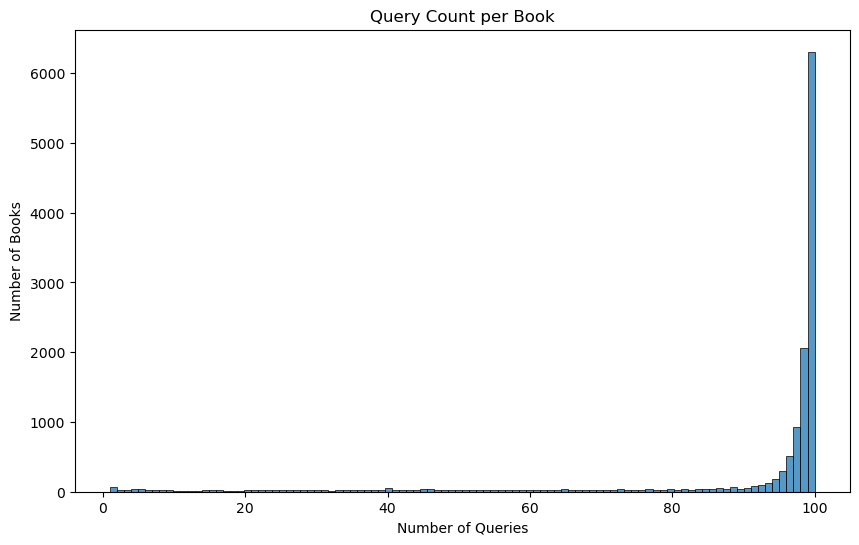

In [130]:
# check number of queries per book plot
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.histplot(merged_df.groupby('book_title').size(), bins=100)
plt.title('Query Count per Book')
plt.xlabel('Number of Queries')
plt.ylabel('Number of Books')
plt.show()

In [149]:
merged_df.to_csv('/home/stellajia/genai-copyright/experiment/query-level-data/merged_query_lvl_with_book_metadata.csv', index=False)

In [150]:
merged_df.head(3)

,book_title,query_id,query,map_file_name,gpt35_answer,gpt4o_answer,llama8b_answer,llama70b_answer,claude_answer,gemini_answer,...,in_books3,num_reviews,num_ratings,avg_rating,genres,goodreads_year,author,isbn13,isbn10_v2,isbn13_v2
0,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"WOMAN Oh, it's ... uh ... lovely, darling. Gir...",insightintoieltsstudentsbookupdatededitionthec...,girl,mum,mum,mum,mum,mum,...,False,4.0,75.0,4.16,['Language'],2003.0,"Jakeman, Vanessa, McDowell, Clare",9.780521e+12,NaN,NaN
1,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"Let's get going shall we, because we've got a ...",insightintoieltsstudentsbookupdatededitionthec...,jack,alex,pearse,john,peter,david,...,False,4.0,75.0,4.16,['Language'],2003.0,"Jakeman, Vanessa, McDowell, Clare",9.780521e+12,NaN,NaN
2,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"Unless you work to keep fit, you run the risk ...",insightintoieltsstudentsbookupdatededitionthec...,medical,rita,unit,NaN,frida,sarah,...,False,4.0,75.0,4.16,['Language'],2003.0,"Jakeman, Vanessa, McDowell, Clare",9.780521e+12,NaN,NaN


## Add Metadata

In [28]:
import pandas as pd
import ast
import numpy as np

data = pd.read_csv('/Users/stellajia/Dropbox/23.Copyright-LLMs/filedata/query-level.csv')
data.columns

Index(['book_title', 'query_id', 'query', 'map_file_name', 'gpt35_answer',
       'gpt4o_answer', 'llama8b_answer', 'llama70b_answer', 'claude_answer',
       'gemini_answer', 'correct_answer', 'in_books3', 'num_reviews',
       'num_ratings', 'avg_rating', 'genres', 'goodreads_year', 'author',
       'isbn13', 'isbn10_v2', 'isbn13_v2'],
      dtype='object')

In [29]:
# remove pub_year -1
print(data.shape)
data = data[data['goodreads_year'] != -1]
print(data.shape)
# rename goodreads_year to pub_year
data = data.rename(columns={'goodreads_year': 'pub_year'})

(1173165, 21)
(1163288, 21)


In [30]:
# Function to safely parse the 'genres' column
def safe_literal_eval(genre_str):
    try:
        return ast.literal_eval(genre_str) if isinstance(genre_str, str) else genre_str
    except (ValueError, SyntaxError):
        return []  # Return an empty list for malformed entries

# Apply the function to convert genres
data['genres'] = data['genres'].apply(safe_literal_eval)

# Fiction and Nonfiction genre sets based on your classification
fiction_genres = [ 
    'Gay Fiction', 'Harlequin', 'Dystopia', 'Supernatural', 'Regency Romance', 'Harlequin Romance',
    'Military Fiction', 'Romantic Suspense', 'Contemporary Romance', 'Science Fiction Fantasy',
    'New Adult', 'Military Fiction', 'Historical Romance', 'Erotica', 'Romance', 'Science Fiction',
    'Classic Literature', 'Historical', 'Erotic Romance', 'Fantasy', 'Realistic Fiction', 'Teen',
    'Retellings', 'Mystery', 'Romantic Suspense', 'Chick Lit', 'Urban Fantasy', 'Epic Fantasy',
    'Medieval Romance', 'Urban', 'Teen', 'Futuristic', 'Western', 'High Fantasy', 'Wildlife', 'Novella',
    'Urban Fantasy', 'Paranormal', 'Humor', 'Pop Culture', 'Chick Lit', 'Urban Fantasy', 'Historical Fiction',
    'Fantasy', 'Historical Romance', 'Steampunk', 'Science Fiction', 'Romance', 'Science Fiction Fantasy',
    'Adventure', 'Suspense', 'Thriller', 'Mystery Thriller', 'Novel', 'Family Saga', 'Fantasy', 'Classics', 'Literature', 'African American',
    'Mythology', 'Civil War Eastern Theater', 'Video Games', 'German Literature', 'Asian Literature', 'Spanish Literature', 'Japanese Literature',
    'Russian Literature', 'Irish Literature', 'Indonesian Literature', 'British Literature', 'Spanish Literature', 'Russian Literature',
    'Japanese Literature', 'Christmas', 'Horror', 'Short Stories', 'Theatre'
]

nonfiction_genres = [ 
    'Theory', 'Sewing', 'Nature', 'Anthropology', 'Fashion', 'Church History', 'Spanish History',
    'Engineering', 'Nutrition', 'Old Testament', 'Military History', 'Cookbooks', 'Political Science',
    'School', 'Books About Books', 'Literary Criticism', 'Psychoanalysis', 'Accounting', 'Management',
    'Money', 'Science', 'Geography', 'History', 'Social Media', 'Biography', 'Health',
    'Mental Health', 'Research', 'Dogs', 'Labor', 'Geology', 'Drama', 'History Of Science', 'Food History',
    'Baseball', 'Class', 'Language', 'Grad School', 'Communication', 'Biology',
    'Australia', 'Social Change', 'True Crime', 'The United States Of America', 'Aviation', 'Zen', 'Russia',
    'Personal Development', 'World History', 'Society', 'Judaism', 'Spiritualism', 'American Civil War',
    'European History', 'Ireland', 'Physics', 'Mathematics', 'Classical Studies', 'Evangelism',
    'Japan', 'Memoir', 'Art History', 'Archaeology', 'Psychiatry', 'Electrical Engineering', 'Reference',
    'Guides', 'Audiobook', 'Computers', 'Programming', 'Self Help', 'Music', 'Victorian', 'Design',
    'Ecology', 'Textbooks', 'Economics', 'Politics', 'Judaica', 'Sociology', 'Plays',
    'Childrens', 'Football', 'Islam', 'Death', 'Sexuality', 'Role Playing Games', 'Leadership', 'Food and Wine',
    'Genetics', 'Contemporary', 'Business', 'Medieval History', 'Road Trip', 'Racing', 'Angels', 'Health Care',
    'Roman', 'Logic', 'Witchcraft', 'Folklore', '20th Century', 'Anglo Saxon', 'New Testament', 'Food', 'Queer',
    'Eugenics', 'Medicine', 'Neuroscience', 'Ancient', 'Urban Planning', 'Travel',
    'Social Science', 'Faith', 'Ghosts', 'Traditional Chinese Medicine', 'Marriage', 'Cultural', 'Theology',
    'Jazz', 'Gothic', 'Photography', 'Cults', 'Journalism', 'Russian History', 'Christianity', 'War', 'Culinary',
    'Demons', 'Theosophy', 'International Relations', 'India', 'Russian Revolution', 'Technical', 'Fairies',
    'Christian Living', 'World War II', 'Soviet Union', 'Taoism', 'Artificial Intelligence', 
    'Ethnography', 'Sports', 'Parenting', 'Brazil', 'Medical',
    'Naval History', 'Vegan', 'Horror', 'Buddhism', 'Astronomy', 'Short Stories', 'Vampires', 'Spain', 'Law',
    'Entrepreneurship', 'World War I', 'Palaeontology', 'Wine', 'Hinduism', 'Health', 'Civil War', 'Civil War History',
    'Greece', 'Menage', 'Anthologies', 'LGBT', 'French Revolution', 'Productivity', 'Mysticism', 'Astrology',
    'College', 'Website Design', 'Feminism', 'Regency', 'Environment', 'Linguistics', 'Philosophy', 'American',
    'Historical Fiction', 'Technology', 'Church',
    'Teaching', 'Poetry', 'Finance', 'Latin American History', 'China', 'Psychology', 'Natural History', 'Adult Fiction',
    'Academic', 'Fitness', 'Cycling', 'Film', 'Gaming', 'Chess', 'Female Authors', 'Holocaust', '18th Century',
    'Computer Science', 'Animals', 'Israel', 'Horticulture', 'Martial Arts', 'Overland Campaign', 'Crime',
    'Shapeshifters', 'Algebra', 'Metaphysics', 'Criticism', 'Photography', 'Cults', 'Adult', 'Us Presidents',
    'Magick', 'Journalism', 'Russian History', 'Christianity', 'War', 'Culinary', 'Art', 'Demons', 'Theosophy',
    'International Relations', 'India', 'Russian Revolution', 'Technical', 'Fairies', 'Christian Living', 'World War II',
    'Soviet Union', 'Taoism', 'Artificial Intelligence', 'Ethnography', 'Sports', 'Parenting',
     'Gay', 'Medical', 'Naval History', 'Vegan',
    'Buddhism', 'Astronomy', 'Vampires', 'Spain', 'Law', 'Entrepreneurship', 'World War I',
    'Palaeontology', 'Wine', 'Hinduism', 'Health', 'Civil War', 'Paranormal Romance', 'Greece', 'Menage', 'Anthologies',
    'Jewish', 'Fantasy', 'Software', 'Cities', 'Disability Studies', 'Harlequin Desire', 'Ancient History', 'Tarot',
    'LGBT', 'French Revolution', 'Productivity', 'Lds', 'Mystery', 'Prayer', 'Drawing', 'Science', 'Hackers', 'Unfinished', 'Architecture', 'Writing', 'Autistic Spectrum Disorder', 'Nursing',
    'Education', 'Africa', 'Social Work', 'Religion', 'Christian', 'Cooking', 'Sex Work', 'Counselling', 'Cars', 'Physical Therapy', 'Spirituality', 'Race', 'Westerns', 'Essays', 'Occult'
]


def classify_genre(genres):
    if genres is None or len(genres) == 0:
        return np.nan, np.nan  # skip if genres is empty or null
    
    # Step 1: Check for 'Fiction' or 'Nonfiction' in genres
    if "fiction" in genres:
        return 1, 0
    elif "nonfiction" in genres:
        return 0, 1

    # Step 2: Check against fictions_list and nonfictions_list if needed
    if any(genre in fiction_genres for genre in genres):
        return 1, 0
    elif any(genre in nonfiction_genres for genre in genres):
        return 0, 1
    
    return np.nan, np.nan  # neither fiction nor nonfiction identified

# Apply the function to create the Fiction and Nonfiction columns
data[['fiction', 'nonfiction']] = data['genres'].apply(lambda x: pd.Series(classify_genre(x)))



In [31]:
data['genres'] = data['genres'].apply(lambda x: np.nan if isinstance(x, list) and len(x) == 0 else x)
data['fiction'] = data['fiction'].astype('Int64')
data['nonfiction'] = data['nonfiction'].astype('Int64')
# data['in_books3'] = data['in_books3# '].astype('Int64')


In [32]:
data.head(2)

,book_title,query_id,query,map_file_name,gpt35_answer,gpt4o_answer,llama8b_answer,llama70b_answer,claude_answer,gemini_answer,...,num_ratings,avg_rating,genres,pub_year,author,isbn13,isbn10_v2,isbn13_v2,fiction,nonfiction
0,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"WOMAN Oh, it's ... uh ... lovely, darling. Gir...",insightintoieltsstudentsbookupdatededitionthec...,girl,mum,mum,mum,mum,mum,...,75.0,4.16,[Language],2003.0,"Jakeman, Vanessa, McDowell, Clare",9.780521e+12,NaN,NaN,0,1
1,insight-into-ielts-student's-book-updated-edit...,insight-into-ielts-student's-book-updated-edit...,"Let's get going shall we, because we've got a ...",insightintoieltsstudentsbookupdatededitionthec...,jack,alex,pearse,john,peter,david,...,75.0,4.16,[Language],2003.0,"Jakeman, Vanessa, McDowell, Clare",9.780521e+12,NaN,NaN,0,1


In [33]:
# check null values
print(data.isna().sum())

book_title              0
query_id                0
query                   4
map_file_name           0
gpt35_answer          324
gpt4o_answer          128
llama8b_answer      62936
llama70b_answer     21095
claude_answer          69
gemini_answer          36
correct_answer         37
in_books3               0
num_reviews             0
num_ratings             0
avg_rating              0
genres             272770
pub_year             2482
author                  0
isbn13                  0
isbn10_v2          716259
isbn13_v2          716259
fiction            292848
nonfiction         292848
dtype: int64


In [43]:
data_test = data.copy()

In [44]:
# remove null gpt, llama, claude, gemini, answer

data_test = data_test[data_test['gpt35_answer'].notna()]
data_test = data_test[data_test['gpt4o_answer'].notna()]
data_test = data_test[data_test['llama8b_answer'].notna()]
data_test = data_test[data_test['llama70b_answer'].notna()]
data_test = data_test[data_test['claude_answer'].notna()]
data_test = data_test[data_test['gemini_answer'].notna()]
data_test = data_test[data_test['correct_answer'].notna()]


In [45]:
print(data_test['map_file_name'].nunique())
print(data_test['book_title'].nunique())

12916
12938


In [46]:
# rename map_file_name to book_title
data_test = data_test.rename(columns={'map_file_name': 'book_id'})

In [47]:
data_test.to_csv('/Users/stellajia/Dropbox/23.Copyright-LLMs/filedata/query-level-final.csv', index=False)

## Test

In [2]:
import pandas as pd
query_lvl_df = pd.read_csv('/Users/stellajia/Dropbox/23.Copyright-LLMs/filedata/query-level-final.csv')
query_lvl_df.columns

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Index(['book_title', 'query_id', 'query', 'book_id', 'gpt35_answer',
       'gpt4o_answer', 'llama8b_answer', 'llama70b_answer', 'claude_answer',
       'gemini_answer', 'correct_answer', 'in_books3', 'num_reviews',
       'num_ratings', 'avg_rating', 'genres', 'pub_year', 'author', 'isbn13',
       'isbn10_v2', 'isbn13_v2', 'fiction', 'nonfiction'],
      dtype='object')

In [3]:
in_books3 = query_lvl_df[query_lvl_df['in_books3'] == True]

In [10]:
# Randomly select 10 rows and print the query and book_title
# Show full text of query and book_title
pd.set_option('display.max_colwidth', None)
in_books3.sample(10)[['query', 'book_title']]


,query,book_title
775256,"We need to buy [MASK] time. When the threat appeared on his holographic map, he saw it was not a ship or a fleet, but a swarm. It looked like a cloud of fine lines. He tried to get a clearer picture, but his computer would not cooperate.","the-clone-redemption,steven-l.-kent"
35745,"One good product is [MASK] by Runtime Software ( www.runtime.org ), which can recover data and program files even when Windows cannot recognize the drive. It can read FAT and NTFS file systems and can solve problems with a corrupted partition table, boot record, or root directory.","a+-guide-to-software,andrews,-jean"
394013,"In fact, [MASK] only now thinking of it (as I write this). I find it very painful to look in the mirror. When I walk past a glass window in a corridor and happen to see my reflection, I get angry on impulse.","the-executioner's-song,norman-mailer,-dave-eggers"
984415,"As prime minister from 1947 to 1948 and then foreign minister from 1948 to 1952, [MASK] prioritized Franco- German reconciliation. In 1950 he issued what became known as the Schuman Declaration, laying the foundations for the EUROPEAN COAL AND STEEL COMMUNITY.","the-wiley-blackwell-dictionary-of-modern-european-history-since-1789,nicholas-atkin,-michael-biddiss,-frank-tallett"
84816,"What a great name. My child was delighting me, making me laugh. And not from a pratfall or some cutesy kid thing, but from deep within the vast magnitude of her imagination. Perhaps my daughter originally intended to keep [MASK] around for a short while.","the-memoir-project:-a-thoroughly-non-standardized-text-for-writing-&-life,marion-roach-smith,-marion-roach"
580288,"She had an affair with him that lasted an estimated thirty-five years, and during much of that time she was married to someone else with whom she had children. What mattered most to [MASK] was her privacy.","lightnin'-hopkins:-his-life-and-blues,alan-govenar"
929674,"We will, in this book, attempt to give an idea as to what the great SECRET IS, exactly, and what reasonable use might be made of it when some use/idea of it is acquired. (To [MASK]s knowledge this is the first time this subject has been presented in this way.","art-and-practice-of-the-occult,ophiel"
641445,"But before I go, one glass of nectar more to drink her health. [MASK] Stand off, or I shall hate you, by Heavens! 120 LOVELESS (Kissing her) In matters of love, a woman's oath is no more to be minded than a man's.","the-relapse,bernard-harris,-john-vanbrugh"
635360,"[MASK] sighed. I suppose if anyone could outwit the Royal Guard it would be that one. Well, Ill think about it. She was fairly sure she would agree, though. She could stand anything for two years, even the agony of being sepa450","sky-of-swords,dave-duncan"
688567,"Nonetheless, with the combination of the invention of print technology, the development of capitalism, and what [MASK] calls the fatality of human linguistic diversity, this progression was perhaps inevitable, and the process, largely unself-conscious.","the-fall-of-language-in-the-age-of-english,minae-mizumura,-juliet-winters-carpenter,-mari-yoshihara"
